# Part 3 Preprocessing and Machine Learning

In [1]:
from utils import *

In [2]:
# Read in the data
tweet_stocks = pd.read_pickle('data/tweet_stocks_EDA.pkl')

# Data Preprocessing

To get the text ready for machine learning, we will remove punctuation, stopwords, junkwords, and normalize the text by making it lowercase and lemmatizing it.

To extract features from the text, we are going to first clean it of any links, mentions, hashtags, and emojis to preserve the syntax of the tweet. We will be looking at two examples during this process.

We have two tweets from Elon Musk that made headlines for how they affected the stock. August 7th, 2018 caused stocks to jump and May 1st, 2020. Let's take a look at these tweets.

In [3]:
# Sample Text
sample = tweet_stocks[tweet_stocks['username'] == 'elonmusk']
sample['date'] = pd.to_datetime(sample['date'])
sample.set_index('date', inplace=True)

pd.options.display.max_colwidth = 1000
sample_increase = sample['2018-08-07']
sample_decrease = sample['2020-05-01']
sample_tweet_increase = sample_increase[['tweet', 'percent change']]
sample_tweet_decrease = sample_decrease[['tweet' ,'percent change']].reset_index().drop(0).set_index('date')
pct_increase = sample_tweet_increase['percent change'].values*100
pct_decrease = sample_tweet_decrease['percent change'].values*100
print('Tweet Increases Stock by {:.3f}%'.format(pct_increase[0]))
print('========================')
print(sample_tweet_increase[['tweet']].values[0][0], '\n')
print('Tweet Decreases Stock by {:.3f}%'.format(pct_decrease[0]))
print('========================')
print(sample_tweet_decrease[['tweet']].values[0][0])

Tweet Increases Stock by 10.391%
Investor support is confirmed. Only reason why this is not certain is that it’s contingent on a shareholder vote. @MindFieldMusic Def no forced sales. Hope all shareholders remain. Will be way smoother &amp; less disruptive as a private company. Ends negative propaganda from shorts. @thatspacegeek Yes, but liquidity events would be limited to every 6 months or so (like SpaceX) Shareholders could either to sell at 420 or hold shares &amp; go private @heydave7 Absolutely. Am super appreciative of Tesla shareholders. Will ensure their prosperity in any scenario. @Gfilche My hope is *all* current investors remain with Tesla even if we’re private. Would create special purpose fund enabling anyone to stay with Tesla. Already do this with Fidelity’s SpaceX investment. @EvotoRentals Yes @FredericLambert I don’t have a controlling vote now &amp; wouldn’t expect any shareholder to have one if we go private. I won’t be selling in either scenario. Good morning 😀 @L

Both twitter samples need to be cleaned, which needs to be able to conserve the context around the text.

In [4]:
tweet_stocks['text'] = tweet_stocks['tweet'].apply(lambda x: clean_text(x, preserve_syntax=True))

In [5]:
sample = tweet_stocks[tweet_stocks['username'] == 'elonmusk']
sample['date'] = pd.to_datetime(sample['date'])
sample.set_index('date', inplace=True)

sample_increase = sample['2018-08-07']
sample_decrease = sample['2020-05-01']
sample_tweet_increase = sample_increase[['text', 'percent change']]
sample_tweet_decrease = sample_decrease[['text' ,'percent change']].reset_index().drop(0).set_index('date')
pct_increase = sample_tweet_increase['percent change'].values*100
pct_decrease = sample_tweet_decrease['percent change'].values*100
print('Cleaned Tweet Increases Stock by {:.3f}%'.format(pct_increase[0]))
print('========================')
print(sample_tweet_increase[['text']].values[0][0], '\n')
print('Cleaned Tweet Decreases Stock by {:.3f}%'.format(pct_decrease[0]))
print('========================')
print(sample_tweet_decrease[['text']].values[0][0])

Cleaned Tweet Increases Stock by 10.391%
Investor support is confirmed. Only reason why this is not certain is that it is contingent on a shareholder vote. Def no forced sales. Hope all shareholders remain. Will be way smoother less disruptive as a private company. Ends negative propaganda from shorts. Yes, but liquidity events would be limited to every 6 months or so like SpaceX Shareholders could either to sell at 420 or hold shares go private Absolutely. Am super appreciative of Tesla shareholders. Will ensure their prosperity in any scenario. My hope is all current investors remain with Tesla even if we are private. Would create special purpose fund enabling anyone to stay with Tesla. Already do this with Fidelitys SpaceX investment. Yes I do not have a controlling vote now would not expect any shareholder to have one if we go private. I will not be selling in either scenario. Good morning 420 Am considering taking Tesla private at 420. Funding secured. 

Cleaned Tweet Decreases St

Apart from a few sentences lacking punctuation, the text itself is preserved including capitalization, which will aid in using Spacy's NLP toolkit to extract text features.

### Extracting Text Features

In [6]:
tweet_stocks['number of emojis'] = tweet_stocks['tweet'].apply(lambda x: emoji_counts(x))

In [7]:
nlp = spacy.load('en_core_web_lg')

In [8]:
# Remove empty tweets after cleaning

tweet_stocks['tweet length'] = tweet_stocks['text'].apply(lambda x: len(x))
tweet_stocks = tweet_stocks[tweet_stocks['tweet length'] != 0]
tweet_stocks.reset_index(inplace=True, drop=True)

In [9]:
%%time
# Clocked at 14min 20s
df = tweet_stocks.copy(deep=True)
text  = 'text'

df['number of sentences'] = df[text].apply(lambda x: num_sentences(x))
df['number of words'] = df[text].apply(lambda x: num_words(x))
df['avg words per sentence'] = df[text].apply(lambda x: avg_words_per_sentence(x))

count = df[text].apply(lambda x: noun_counts(x))
df['number of nouns'] = 0
for i in range(len(count)):
    df['number of nouns'].iloc[i] = count[i][0]

count = df[text].apply(lambda x: verb_counts(x))
df['number of verbs'] = 0
for i in range(len(count)):
    df['number of verbs'].iloc[i] = count[i][0]

count = df[text].apply(lambda x: stopword_counts(x))
df['number of stopwords'] = 0
for i in range(len(count)):
    df['number of stopwords'].iloc[i] = count[i][0]

count = df[text].apply(lambda x: org_counts(x))
df['number of organizations'] = 0
for i in range(len(count)):
    df['number of organizations'].iloc[i] = count[i][0]

KeyboardInterrupt: 

In [10]:
tweet_stocks = df

In [11]:
print(nlp.Defaults.stop_words)

{'anyone', 'three', 'various', 'against', 'during', 'onto', 'until', 'doing', 'become', 'herself', 'hereafter', 'more', 'put', 'due', 'perhaps', 'under', 'made', 'her', 'not', 'thus', 'eleven', 'former', 'itself', 'beside', 'back', 'nobody', 'toward', 'forty', '’ve', 'mostly', 'several', 'most', 'another', 'ours', 'fifty', 'much', 'per', 'across', 'less', 'namely', 'at', 'rather', 'show', 'say', 'as', 'above', 'must', 'upon', 'thereafter', 'which', 'noone', 'hereupon', 'other', 'to', 'each', 'am', 'meanwhile', 'take', '’d', "'m", 'may', 'otherwise', 'on', 'herein', 'four', 'whither', 'will', 'call', 'quite', '‘d', 'should', 'up', 'everything', 'no', 'afterwards', 'once', 'everyone', 'whereby', 'alone', '‘ve', 'while', 'did', 'what', 'by', 'do', 'had', 'him', 'see', '‘m', 'how', 'six', 'moreover', 'although', 'within', 'full', 'they', 'whose', 'who', '’m', 'twelve', 'indeed', 'here', 'then', 'were', 'when', 'around', 'fifteen', 'or', 'could', 'me', 'have', 'that', 'formerly', 'amongst',

In [12]:
# Will add or remove to this list as needed

not_stop_words_list = ["too", "not", "below", "under", "over", "up", "down", "move"]
for word in not_stop_words_list:
    nlp.Defaults.stop_words.remove(word)

In [13]:
STOP_WORDS = nlp.Defaults.stop_words

In [14]:
sample_increase['text']

date
2018-08-07 16:00:00    Investor support is confirmed. Only reason why this is not certain is that it is contingent on a shareholder vote. Def no forced sales. Hope all shareholders remain. Will be way smoother less disruptive as a private company. Ends negative propaganda from shorts. Yes, but liquidity events would be limited to every 6 months or so like SpaceX Shareholders could either to sell at 420 or hold shares go private Absolutely. Am super appreciative of Tesla shareholders. Will ensure their prosperity in any scenario. My hope is all current investors remain with Tesla even if we are private. Would create special purpose fund enabling anyone to stay with Tesla. Already do this with Fidelitys SpaceX investment. Yes I do not have a controlling vote now would not expect any shareholder to have one if we go private. I will not be selling in either scenario. Good morning 420 Am considering taking Tesla private at 420. Funding secured.
Name: text, dtype: object

In [15]:
sample_increase['text'].apply(lambda x: extract_key_sentences(x, 'tesla'))

date
2018-08-07 16:00:00    am super appreciative of tesla shareholders. my hope is all current investors remain with tesla even if we are private. would create special purpose fund enabling anyone to stay with tesla. good morning 420 am considering taking tesla private at 420. funding secured.
Name: text, dtype: object

In [16]:
sample_increase['cleaned'] = sample_increase['tweet'].apply(lambda x: clean_text(x, stop_words=STOP_WORDS))
sample_decrease['cleaned'] = sample_decrease['tweet'].apply(lambda x: clean_text(x, stop_words=STOP_WORDS))

In [17]:
sample_increase[['cleaned']]

,cleaned
date,
2018-08-07 16:00:00,investor support confirm reason not certain contingent shareholder vote def force sale hope shareholder remain way smoother disruptive private company end negative propaganda short yes liquidity event limited month like spacex shareholder sell hold share private absolutely super appreciative tesla shareholder ensure prosperity scenario hope current investor remain tesla private create special purpose fund enable stay tesla fidelitys spacex investment yes not control vote not expect shareholder private not sell scenario good morning consider take tesla private funding secure


In [18]:
#print(sample_increase['cleaned'].to_markdown())

| date                | cleaned                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              |
|:--------------------|:---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [19]:
sample_decrease[['cleaned']]

,cleaned
date,
2020-05-01 09:30:00,got exactly say need stop
2020-05-01 16:00:00,baby monday not need cash devote mars earth possession weigh down gf mad stipulation sale gene wilders old house tear down lose soul rage rage die light consciousness exactly cheaply freedom sell over land free home brave oh starspangled banner wave give proof night flag rocket red glare bomb burst air people freedom tesla stock price too high go sell physical possession house incentive matter starship make good progress real


We can see from the cleaned text that there are going to be some words that won't be recognized. Let's look at all short words and see if they can be removed.

In [ ]:
%%time
# Clocked at 3min 26s
tweet_stocks['cleaned'] = tweet_stocks['text'].apply(lambda x:clean_text(x, stop_words=STOP_WORDS))

In [ ]:
all_text = " ".join(tweet_stocks['cleaned'])
orig_len = len(all_text)
small_words = [word for word in all_text.split() if len(word) <= 2]
small_words = set(small_words)

In [ ]:
print(small_words)

Let's remove these

In [ ]:
sample_decrease['cleaned'] = sample_decrease['cleaned'].apply(lambda x:" ".join([x for x in x.split() if x not in small_words]))

In [ ]:
sample_increase[['cleaned']]

In [ ]:
sample_decrease[['cleaned']]

This looks like it works. Let's apply it over the whole dataframe.

In [ ]:
tweet_stocks['cleaned'] = tweet_stocks['cleaned'].apply(lambda x:" ".join([x for x in x.split() if x not in small_words]))

Let's now look at infrequent words to see if we can remove any of them.

In [ ]:
freq_words = pd.Series(all_text.split()).value_counts()
rare_words = freq_words[freq_words.values == 1]

In [ ]:
print(rare_words)

A lot of these are misspellings and can be safely removed. 

In [ ]:
tweet_stocks['cleaned'] = tweet_stocks['cleaned'].apply(lambda x:" ".join([x for x in x.split() if x not in rare_words]))

In [ ]:
sample_increase[['cleaned']]

In [ ]:
all_text = " ".join(tweet_stocks['cleaned'])
cleaned_len = len(all_text)

In [ ]:
print('Original Text Length: {}'.format(orig_len))
print('Cleaned Text Length: {}'.format(cleaned_len))
print('Cleaned / Original: {:.2f}'.format(cleaned_len / orig_len))

In [ ]:
pd.to_pickle(tweet_stocks, './data/pre_processed_df.pkl')

# Separate Training, Test, and Holdout Sets

1. Pick Username
2. Show Distribution of Target Variable
3. Select Features (Text and Non-Text)
4. Scale the Data
5. Dimension Reduction
6. Split into Training/Testing
7. Separate Holdout from Training
8. Perform cross validation
9. Look at Results
10. Tune Hyperparameters
11. Run Test Data
12. Interpretability

In [3]:
save = pd.read_pickle('./data/pre_processed_df.pkl')

In [4]:
tweet_stocks = save
df = tweet_stocks.copy(deep=True)

In [5]:
numerical_feat = [
    'mentions', 'hashtags', 'cashtags',
       'video', 'photos', 'urls', 'replies_count', 'retweets_count',
       'likes_count', 'number of tweets',
       'number of emojis', 'tweet length', 'number of sentences',
       'number of words', 'avg words per sentence', 'number of nouns',
       'number of verbs', 'number of stopwords', 'number of organizations',
       ]
original_features = numerical_feat
text_feat = ['tweet', 'text', 'cleaned']
targets = []
all_scores = {}
cv_scores = {}
models = {}

In [6]:
# Make Different Binning Types

bin_name = 'no change_change'
tweet_stocks[bin_name] = 'change'
tweet_stocks[bin_name][tweet_stocks['bins'] == 'no change'] = 'no change'
targets.append(bin_name)

In [7]:
full_df = tweet_stocks.copy(deep=True)
df_training, df_testing = train_test_split(full_df, test_size=0.3)

In [8]:
chi2_sig(df_training, bin_name, numerical_feat, 'cleaned')

Statistically Significant Words Per Bin
P_val = 0.95

# change:
  . selected features: 19
  . top features: reopen,ppe,mask,excession,giuseppe,physically,lettuce,quote,boundless,manufacturing
 
# no change:
  . selected features: 19
  . top features: reopen,ppe,mask,excession,giuseppe,physically,lettuce,quote,boundless,manufacturing
 
Statistically Significant Features Per Bin
P_val = 0.95

# change:
  . selected features: 3
  . top features: photos,video,avg words per sentence
 
# no change:
  . selected features: 3
  . top features: photos,video,avg words per sentence
 


# Choosing a metric

We could look at this problem in one of two ways: if an investor were to use this machine learning approach to evaluate investment opportunites from twitter data, assuming predicting stock price increases are the positive label and drops are negative, a risky investor would prioritize correctly predicting rising stocks to minimize opportunity loss. This would be a reason to look at recall scores for model metrics as it provides an indication of missed positive predictions. 

>Recall = TP / (TP + FN)

Other metrics like F1 and the ROC-AUC score are also appropriate as it incorporates loss mitigation as a factor (both are indicators of how to optimize both precision and recall).

Sensitivity-Specificity Metrics
Sensitivity refers to the true positive rate and summarizes how well the positive class was predicted.

**Sensitivity** = TruePositive / (TruePositive + FalseNegative)

In binary classifiers, the recall of the positive class label is the sensitivity, and the recall of the negative is the specificity. 

Unlike precision that only comments on the correct positive predictions out of all positive predictions, recall provides an indication of missed positive predictions.
For imbalanced learning, recall is typically used to measure the coverage of the minority class.

**Specificity** = TrueNegative / (FalsePositive + TrueNegative)
For imbalanced classification, the sensitivity might be more interesting than the specificity.

Sensitivity and Specificity can be combined into a single score that balances both concerns, called the geometric mean or G-Mean.

**G-Mean** = sqrt(Sensitivity * Specificity)

# Separate Data into Training/Testing and put Testing Aside

### Change / No Change
In this scenario, an investor is using social media to see if there are going to be stocks worth watching, so machine learning will be used predict if there is an sufficient change in stock price as determined by a set threshold. Because the data are likely to be imbalanced, the harmonic mean of the precision (measure of stocks correctly identified as changing out of all stocks that did change), and the recall (out of all the stocks that did change, how many were correctly identified as changing).

In [9]:
labels = ['no change', 'change']

In [10]:
df = df_training.copy(deep=True)
numerical_feat = original_features.copy()
text_name = 'cleaned'
col_name = 'no change_change'
target_name = 'classification'

df[target_name] = 0
df[target_name][df[col_name] == labels[1]] = 1

Value Counts:
classification
0                 6589
1                 1484
dtype: int64


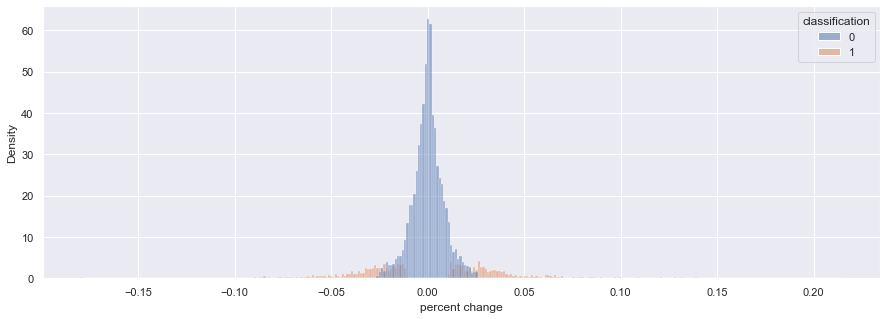

count    8073.000000
mean        0.000631
std         0.019852
min        -0.179500
25%        -0.005590
50%         0.000138
75%         0.006429
max         0.214807
Name: percent change, dtype: float64


In [11]:
# Define user, target, feature names
print('Value Counts:')
print(df[[target_name]].value_counts())
sns.set()
plt.figure(figsize=[15,5])
_ = sns.histplot(data = df, x='percent change', hue=target_name, stat='density')
plt.savefig('./figures/modeling/{}_distribution.png'.format(col_name), bbox_inches='tight')
plt.show()
print(df['percent change'].describe())

This dataset is imbalanced. The positive class (change) makes up only ~18% of data. As we are looking to see if Twitter data can predict that stocks will rise of fall within a certain percentage

In [12]:
%%time
# Clocked at 10min 40s
len_1 = len(df[df[target_name] == 0])
len_2 = len(df[df[target_name] == 1])
class_weight = {0:1, 1:(len_1/len_2)}

print('class 0 size: {:.3f}'.format(len_1))
print('class 1 size: {:.3f}'.format(len_2))
print('class weights: ', class_weight)

svm = SVC(probability = True, class_weight=class_weight)
lgr = LogisticRegression(n_jobs=-1, class_weight=class_weight)
nb = MultinomialNB()
clf_list = [svm, lgr, nb]

scores = cross_validation_scores(df, target_name, numerical_feat, text_name, clf_list)

class 0 size: 6589.000
class 1 size: 1484.000
class weights:  {0: 1, 1: 4.440026954177897}
CPU times: user 5min 34s, sys: 8.6 s, total: 5min 43s
Wall time: 6min 12s


In [13]:
cv_key =  "cv_1"
scores['n_features'] = len(numerical_feat)
cv_scores[cv_key] = scores
all_scores[col_name] = cv_scores


In [79]:
#col_name = 'no change_change'
#cv_key = 'cv_1'
#print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
#print(all_scores[col_name][cv_key].sort_values(by='test_roc_auc_mean', ascending=False).reset_index(drop=True)[:5].to_markdown())

The top scorer were all from the gradient descent classifier. Because the data are imbalanced, we can add a class_weight to the classifier to see if the results are any better. We will do the same to the Logistic Regression as it typically performs better than gradient descent.

This is a big improvement. Logistic Regression has a better mean F1 and smaller std than the Stochastic Gradient Descent with the weighted scores. However the average fit time is rougly 7x longer. This isn't a problem now, but it will be an issue when we look at hypertuning the parameters. We will look to reducing the data to aid in this.

COLUMN: no change_change 
  CV_KEY: cv_1
richardbranson
Test_roc_auc_mean: 0.791
Test_roc_auc_std: 0.034
Range of test_roc_auc_mean: 0.756 -- 0.825
LogisticRegression(class_weight={0: 1, 1: 4.440026954177897}, n_jobs=-1)
The mean cross-validation accuracy is: 0.837 +/- 0.025
Precision: 0.415
Recall: 0.440
Balanced accuracy: 0.678
              precision    recall  f1-score   support

           0       0.92      0.92      0.92       368
           1       0.42      0.44      0.43        50

    accuracy                           0.86       418
   macro avg       0.67      0.68      0.67       418
weighted avg       0.86      0.86      0.86       418



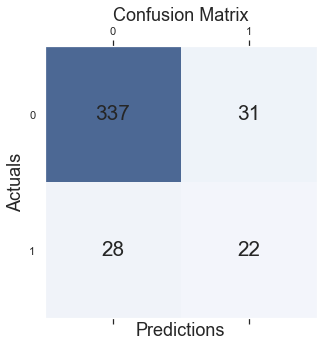

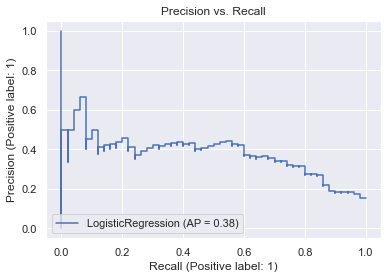

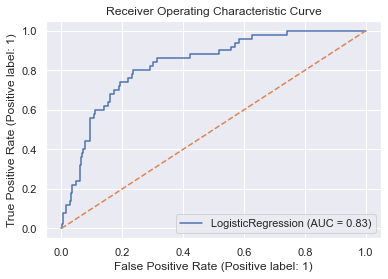

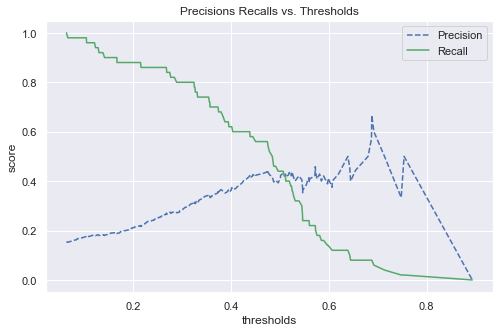

In [15]:
scorer = 'test_roc_auc'
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
_ = examine_model(df, all_scores[col_name][cv_key], scorer, target_name, numerical_feat, pos=0, reduce=False)

We will look to reduce the dimensions through PCA, TruncatedSVD, and feature selection. 

In [16]:
user = all_scores[col_name][cv_key].sort_values(by='test_roc_auc_mean', ascending=False).reset_index(drop=True)['username'][0]
clf = all_scores[col_name][cv_key].sort_values(by='test_roc_auc_mean', ascending=False).reset_index(drop=True)['model'][0]
df = df[df['username'] == user].copy(deep=True)
X, y = make_xy(df, target_name, numerical_feat, text_name)

In [17]:
chi2_sig(df, bin_name, numerical_feat, 'cleaned')

Statistically Significant Words Per Bin
P_val = 0.95

# change:
  . selected features: 13
  . top features: conversation,handwritten,dip,boundless,aha,breathtake,bertrand,footage,executive,graham
 
# no change:
  . selected features: 13
  . top features: conversation,handwritten,dip,boundless,aha,breathtake,bertrand,footage,executive,graham
 
Statistically Significant Features Per Bin
P_val = 0.95

# change:
  . selected features: 10
  . top features: photos,urls,video,number of verbs,tweet length,number of stopwords,number of words,number of nouns,avg words per sentence,number of tweets
 
# no change:
  . selected features: 10
  . top features: photos,urls,video,number of verbs,tweet length,number of stopwords,number of words,number of nouns,avg words per sentence,number of tweets
 


Value Counts:
classification
0                 1224
1                  167
dtype: int64


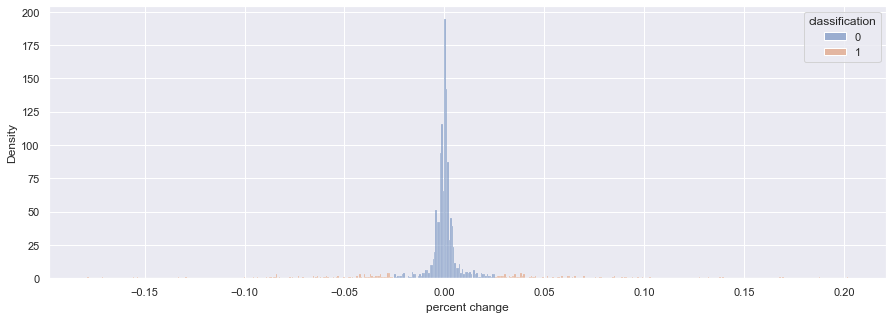

count    1391.000000
mean        0.000262
std         0.024693
min        -0.178809
25%        -0.002079
50%         0.000000
75%         0.002010
max         0.202145
Name: percent change, dtype: float64
lower no change boundary: -0.025, upper no chnage boundary:0.025


In [18]:
print('Value Counts:')
print(df[[target_name]].value_counts())
sns.set()
plt.figure(figsize=[15,5])
_ = sns.histplot(data = df, x='percent change', hue=target_name, stat='density')
plt.savefig('./figures/modeling/{}_{}_distribution.png'.format(col_name, user), bbox_inches='tight')
plt.show()
print(df['percent change'].describe())
print("lower no change boundary: {:.3f}, upper no chnage boundary:{:.3f}".format(df['percent change'][df[target_name]==0].min(), df['percent change'][df[target_name]==0].max()))

In [19]:
%%time
# Clocked at 9min 20s
grid={
    "C":np.logspace(-3,3,7), "penalty":["l1","l2"], "dual":[False, True],
    "solver" : ['liblinear', 'saga']
} 

len_1 = len(df[df['classification'] == 0])
len_2 = len(df[df['classification'] == 1])
class_weight = {0:1, 1:(len_1/len_2)}

# Separate into Training/Testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, stratify=y)
scoring = 'roc_auc'
clf = LogisticRegression(n_jobs=-1, class_weight=class_weight)
clf_cv=GridSearchCV(clf,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))

tuned hyperparameters :(best parameters)  {'C': 1.0, 'dual': False, 'penalty': 'l1', 'solver': 'saga'}
best score : 0.7814004269784023
COLUMN: no change_change 
  CV_KEY: cv_1
CPU times: user 1min 16s, sys: 11.6 s, total: 1min 28s
Wall time: 7min 22s


In [20]:
chi2_sig(df, bin_name, numerical_feat, 'cleaned')

Statistically Significant Words Per Bin
P_val = 0.95

# change:
  . selected features: 13
  . top features: conversation,handwritten,dip,boundless,aha,breathtake,bertrand,footage,executive,graham
 
# no change:
  . selected features: 13
  . top features: conversation,handwritten,dip,boundless,aha,breathtake,bertrand,footage,executive,graham
 
Statistically Significant Features Per Bin
P_val = 0.95

# change:
  . selected features: 10
  . top features: photos,urls,video,number of verbs,tweet length,number of stopwords,number of words,number of nouns,avg words per sentence,number of tweets
 
# no change:
  . selected features: 10
  . top features: photos,urls,video,number of verbs,tweet length,number of stopwords,number of words,number of nouns,avg words per sentence,number of tweets
 


In [21]:
model_key =  col_name + '_clf_1'
key = "clf_cv_1"

# Save Results
models[model_key] = clf_cv

lgr_params = pd.DataFrame(clf_cv.cv_results_)
lgr_params['username'] = user
lgr_params['scoring'] = scoring
lgr_params['n_class_0'] = len_1
lgr_params['n_class_1'] = len_2

cv_scores[key] = lgr_params

all_scores[col_name] = cv_scores

LogisticRegression(class_weight={0: 1, 1: 7.3293413173652695}, n_jobs=-1,
                   penalty='l1', solver='saga')
richardbranson
COLUMN: no change_change
 MODEL_KEY: no change_change_clf_1
 CV_KEY: clf_cv_1
The mean cross-validation accuracy is: 0.771 +/- 0.027
Precision: 0.330
Recall: 0.760
Balanced accuracy: 0.775
              precision    recall  f1-score   support

           0       0.96      0.79      0.87       368
           1       0.33      0.76      0.46        50

    accuracy                           0.79       418
   macro avg       0.65      0.78      0.66       418
weighted avg       0.89      0.79      0.82       418



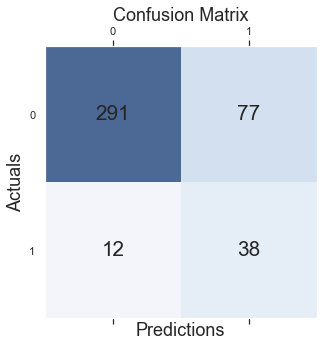

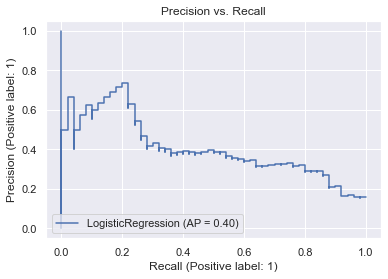

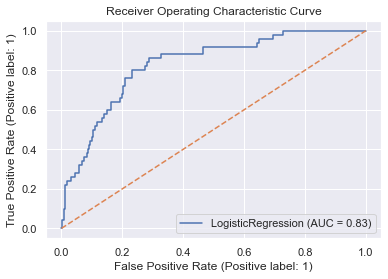

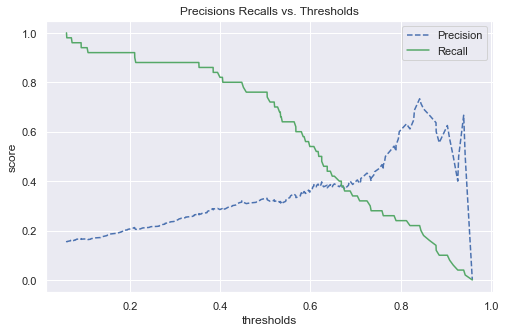

In [22]:
clf = models[model_key].best_estimator_
print(clf)
print(user)
print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
full_report(clf, X_train, X_test, y_train, y_test)
y_proba = clf.predict_proba(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

# Business-Case Testing and Modeling
In our scenario, an investor would want to see stock changes as quickly as possible, so the twitter features number of replies, retweets, and likes should be discarded as a prediction of new stock price changes on trained on historical data wouldn't have nearly as many counts in those features, and thus aren't a good representation of a real-world application.

In [23]:
numerical_feat = ['mentions',
 'hashtags',
 'cashtags',
 'video',
 'photos',
 'urls',
 'number of tweets',
 'number of emojis',
 'tweet length',
 'number of sentences',
 'number of words',
 'avg words per sentence',
 'number of nouns',
 'number of verbs',
 'number of stopwords',
 'number of organizations']

df = df_training.copy(deep=True)

text_name = 'cleaned'
col_name = 'no change_change'
target_name = 'classification'

df[target_name] = 0
df[target_name][df[col_name] == labels[1]] = 1

In [24]:
X = df_training[numerical_feat]
features_list = X.columns
y = df_training[bin_name]
clf = RandomForestClassifier(n_jobs=-1)
model = clf.fit(X, y)
most_important_features(model, X, y, features_list)

Important Features:

   avg words per sentence 0.089 +/- 0.002
          number of nouns 0.066 +/- 0.002
             tweet length 0.063 +/- 0.001
                   photos 0.062 +/- 0.002
         number of tweets 0.057 +/- 0.002
      number of stopwords 0.055 +/- 0.001
         number of emojis 0.044 +/- 0.001
          number of verbs 0.042 +/- 0.002
                     urls 0.038 +/- 0.001
                    video 0.034 +/- 0.002
          number of words 0.032 +/- 0.001
      number of sentences 0.027 +/- 0.001
                 mentions 0.025 +/- 0.001
  number of organizations 0.024 +/- 0.001
                 hashtags 0.018 +/- 0.001
                 cashtags 0.001 +/- 0.000


In [25]:
#for user in df['username'].unique():
#    report =df[df['username'] == user].set_index('date').profile_report()
#    report.to_file(output_file="./figures/modeling/{}_case_study_report.html".format(user))

In [26]:
%%time
# Clocked in at 8min 20s
len_1 = len(df[df['classification'] == 0])
len_2 = len(df[df['classification'] == 1])
class_weight = {0:1, 1:(len_1/len_2)}

print('class 0 size: {:.3f}'.format(len_1))
print('class 1 size: {:.3f}'.format(len_2))
print('class weights: ', class_weight)

svm = SVC(probability=True, class_weight=class_weight)
lgr = LogisticRegression(n_jobs=-1, class_weight=class_weight)
nb = MultinomialNB()
clf_list = [svm, lgr, nb]

scores = cross_validation_scores(df, target_name, numerical_feat, text_name, clf_list)

class 0 size: 6589.000
class 1 size: 1484.000
class weights:  {0: 1, 1: 4.440026954177897}
CPU times: user 5min 36s, sys: 8.81 s, total: 5min 45s
Wall time: 6min 14s


In [27]:
cv_key =  "cv_3"
scores['n_features'] = len(numerical_feat)
cv_scores[cv_key] = scores
all_scores[col_name] = cv_scores

In [82]:
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
all_scores[col_name][cv_key].sort_values(by='test_roc_auc_mean', ascending=False).reset_index(drop=True)[:7]

COLUMN: no change_change 
  CV_KEY: cv_3


,username,model,fit_time_mean,fit_time_std,score_time_mean,score_time_std,test_balanced_accuracy_mean,test_balanced_accuracy_std,test_precision_mean,test_precision_std,test_recall_mean,test_recall_std,test_f1_mean,test_f1_std,test_roc_auc_mean,test_roc_auc_std,n_samples,n_pos_label,n_features
0,richardbranson,"LogisticRegression(class_weight={0: 1, 1: 4.44...",1.696083,0.433501,0.069580,0.002587,0.642933,0.044872,0.351640,0.068829,0.385145,0.093482,0.363525,0.066903,0.799770,0.027139,973,117,16
1,richardbranson,"SVC(class_weight={0: 1, 1: 4.440026954177897},...",8.384865,1.551226,1.017819,0.165583,0.547630,0.020539,0.515714,0.138173,0.111594,0.049788,0.176653,0.066043,0.775547,0.035132,973,117,16
2,richardbranson,MultinomialNB(),0.047445,0.000704,0.068166,0.001020,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.761457,0.029522,973,117,16
3,Benioff,"SVC(class_weight={0: 1, 1: 4.440026954177897},...",6.549749,0.045720,1.008647,0.009414,0.514802,0.022356,0.264127,0.187240,0.057983,0.054252,0.093099,0.083771,0.603047,0.044839,877,173,16
4,Benioff,"LogisticRegression(class_weight={0: 1, 1: 4.44...",0.914553,0.044246,0.064929,0.004523,0.558090,0.034875,0.310198,0.087673,0.277983,0.072302,0.286235,0.053822,0.578664,0.041024,877,173,16
5,JohnLegere,MultinomialNB(),0.064483,0.000570,0.076102,0.000557,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.547768,0.019459,1632,342,16
6,elonmusk,"LogisticRegression(class_weight={0: 1, 1: 4.44...",1.378073,0.064103,0.075876,0.001172,0.505284,0.031412,0.205848,0.056257,0.192567,0.059916,0.197988,0.056130,0.530443,0.055387,1054,208,16


In [84]:
#col_name = 'no change_change'
#cv_key = 'cv_3'
#print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
#print(all_scores[col_name][cv_key].sort_values(by='test_roc_auc_mean', ascending=False).reset_index(drop=True)[:7].to_markdown())

COLUMN: no change_change 
  CV_KEY: cv_3
richardbranson
Test_roc_auc_mean: 0.800
Test_roc_auc_std: 0.027
Range of test_roc_auc_mean: 0.773 -- 0.827
LogisticRegression(class_weight={0: 1, 1: 4.440026954177897}, n_jobs=-1)
The mean cross-validation accuracy is: 0.829 +/- 0.021
Precision: 0.435
Recall: 0.400
Balanced accuracy: 0.665
              precision    recall  f1-score   support

           0       0.92      0.93      0.92       368
           1       0.43      0.40      0.42        50

    accuracy                           0.87       418
   macro avg       0.68      0.66      0.67       418
weighted avg       0.86      0.87      0.86       418



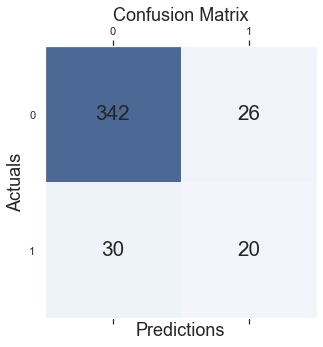

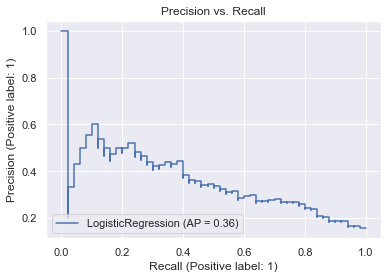

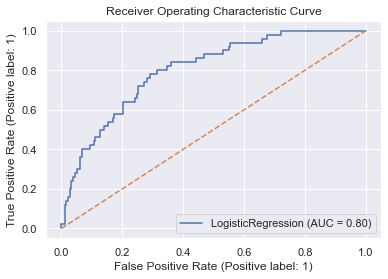

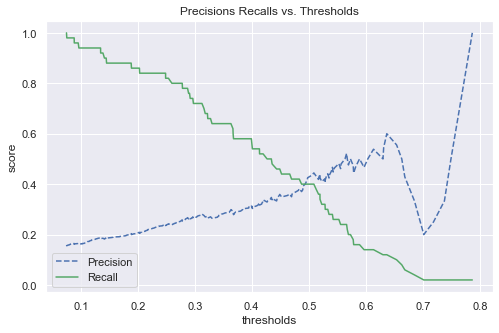

In [29]:
scorer = 'test_roc_auc'
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
_ = examine_model(df, all_scores[col_name][cv_key], scorer, target_name, numerical_feat, pos=0, reduce=False)

COLUMN: no change_change 
  CV_KEY: cv_3
richardbranson
Test_roc_auc_mean: 0.776
Test_roc_auc_std: 0.035
Range of test_roc_auc_mean: 0.740 -- 0.811
SVC(class_weight={0: 1, 1: 4.440026954177897}, probability=True)
The mean cross-validation accuracy is: 0.877 +/- 0.007
Precision: 0.333
Recall: 0.080
Balanced accuracy: 0.529
              precision    recall  f1-score   support

           0       0.89      0.98      0.93       368
           1       0.33      0.08      0.13        50

    accuracy                           0.87       418
   macro avg       0.61      0.53      0.53       418
weighted avg       0.82      0.87      0.83       418



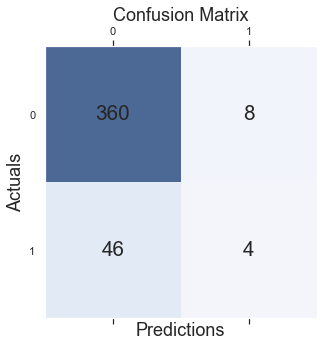

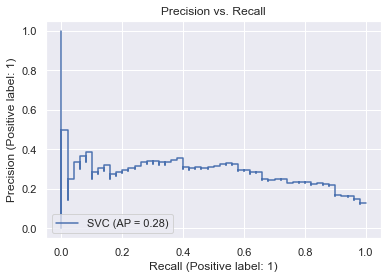

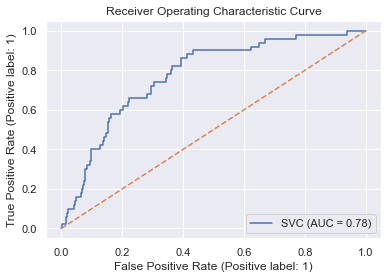

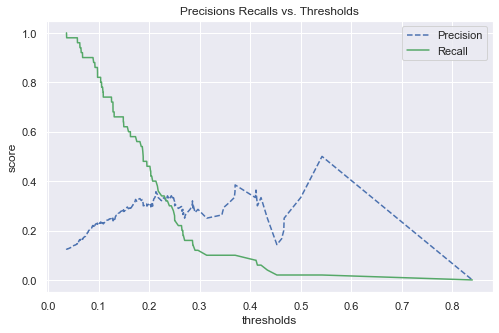

In [30]:
scorer = 'test_roc_auc'
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
_ = examine_model(df, all_scores[col_name][cv_key], scorer, target_name, numerical_feat, pos=1, reduce=False)

The models are fairly similar, but the recall from the logistic regression is better than the support vector machines. The precision is reversed, but we are looking to optimize recall, and looking at the precisions, recalls, and thresholds indicates model optimization would be better with logistic regression

In [32]:
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
all_scores[col_name][cv_key].sort_values(by='test_roc_auc_mean', ascending=False).reset_index(drop=True)

COLUMN: no change_change 
  CV_KEY: cv_3


,username,model,fit_time_mean,fit_time_std,score_time_mean,score_time_std,test_balanced_accuracy_mean,test_balanced_accuracy_std,test_precision_mean,test_precision_std,test_recall_mean,test_recall_std,test_f1_mean,test_f1_std,test_roc_auc_mean,test_roc_auc_std,n_samples,n_pos_label,n_features
0,richardbranson,"LogisticRegression(class_weight={0: 1, 1: 4.44...",1.696083,0.433501,0.069580,0.002587,0.642933,0.044872,0.351640,0.068829,0.385145,0.093482,0.363525,0.066903,0.799770,0.027139,973,117,16
1,richardbranson,"SVC(class_weight={0: 1, 1: 4.440026954177897},...",8.384865,1.551226,1.017819,0.165583,0.547630,0.020539,0.515714,0.138173,0.111594,0.049788,0.176653,0.066043,0.775547,0.035132,973,117,16
2,richardbranson,MultinomialNB(),0.047445,0.000704,0.068166,0.001020,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.761457,0.029522,973,117,16
3,Benioff,"SVC(class_weight={0: 1, 1: 4.440026954177897},...",6.549749,0.045720,1.008647,0.009414,0.514802,0.022356,0.264127,0.187240,0.057983,0.054252,0.093099,0.083771,0.603047,0.044839,877,173,16
4,Benioff,"LogisticRegression(class_weight={0: 1, 1: 4.44...",0.914553,0.044246,0.064929,0.004523,0.558090,0.034875,0.310198,0.087673,0.277983,0.072302,0.286235,0.053822,0.578664,0.041024,877,173,16
5,JohnLegere,MultinomialNB(),0.064483,0.000570,0.076102,0.000557,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.547768,0.019459,1632,342,16
6,elonmusk,"LogisticRegression(class_weight={0: 1, 1: 4.44...",1.378073,0.064103,0.075876,0.001172,0.505284,0.031412,0.205848,0.056257,0.192567,0.059916,0.197988,0.056130,0.530443,0.055387,1054,208,16
7,JohnLegere,"LogisticRegression(class_weight={0: 1, 1: 4.44...",2.393340,0.231089,0.075438,0.002092,0.510651,0.006704,0.220898,0.005914,0.330605,0.043774,0.263823,0.015441,0.516996,0.024220,1632,342,16
8,JohnLegere,"SVC(class_weight={0: 1, 1: 4.440026954177897},...",27.580818,0.256015,4.074708,0.074530,0.506561,0.007127,0.343333,0.154380,0.026300,0.012127,0.048799,0.022435,0.511375,0.025427,1632,342,16
9,Benioff,MultinomialNB(),0.042321,0.000567,0.062479,0.000314,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.510355,0.059815,877,173,16


COLUMN: no change_change 
  CV_KEY: cv_3
elonmusk
Test_roc_auc_mean: 0.530
Test_roc_auc_std: 0.055
Range of test_roc_auc_mean: 0.475 -- 0.586
LogisticRegression(class_weight={0: 1, 1: 4.440026954177897}, n_jobs=-1)
The mean cross-validation accuracy is: 0.685 +/- 0.023
Precision: 0.174
Recall: 0.180
Balanced accuracy: 0.485
              precision    recall  f1-score   support

           0       0.80      0.79      0.79       363
           1       0.17      0.18      0.18        89

    accuracy                           0.67       452
   macro avg       0.49      0.49      0.49       452
weighted avg       0.67      0.67      0.67       452



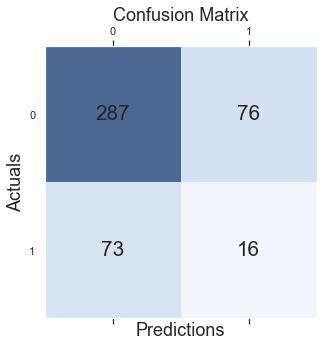

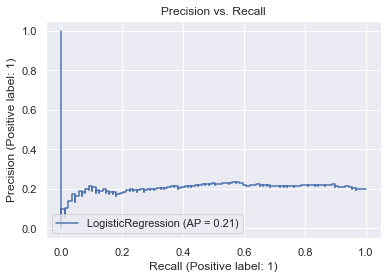

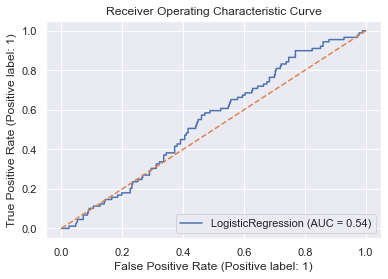

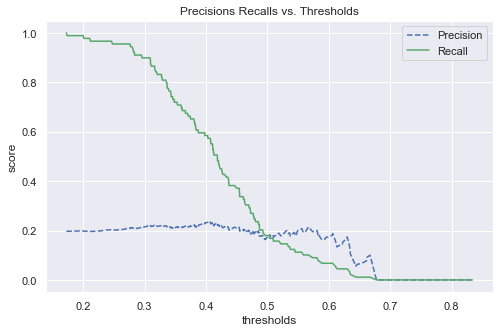

In [33]:
scorer = 'test_roc_auc'
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
_ = examine_model(df, all_scores[col_name][cv_key], scorer, target_name, numerical_feat, pos=6, reduce=False)

In [34]:
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
user = all_scores[col_name][cv_key].sort_values(by='test_roc_auc_mean', ascending=False).reset_index(drop=True)['username'][0]
clf = all_scores[col_name][cv_key].sort_values(by='test_roc_auc_mean', ascending=False).reset_index(drop=True)['model'][0]
df = df[df['username'] == user].copy(deep=True)
X, y = make_xy(
    df,
    target_name,
    numerical_feat,
    text_name,
    min_df=1,
    ngram_range=(1, 1),
    decomp=False,
)

COLUMN: no change_change 
  CV_KEY: cv_3


In [35]:
X_import = df[numerical_feat]
features_list = X_import.columns
y_import = df[bin_name]
clf = RandomForestClassifier(n_jobs=-1)
model = clf.fit(X_import, y_import)
most_important_features(model, X_import, y_import, features_list)

Important Features:

                   photos 0.058 +/- 0.004
   avg words per sentence 0.038 +/- 0.003
             tweet length 0.035 +/- 0.003
      number of stopwords 0.033 +/- 0.003
          number of verbs 0.032 +/- 0.002
                     urls 0.029 +/- 0.003
                 mentions 0.027 +/- 0.003
          number of nouns 0.024 +/- 0.002
          number of words 0.022 +/- 0.003
                 hashtags 0.017 +/- 0.002
                    video 0.013 +/- 0.002
         number of tweets 0.011 +/- 0.002
      number of sentences 0.006 +/- 0.001
  number of organizations 0.003 +/- 0.001
         number of emojis 0.001 +/- 0.000


In [36]:
%%time
# Clocked at 9min 20s
grid={
    "C":np.logspace(-3,3,7), "penalty":["l1","l2"], "dual":[False, True],
    "solver" : ['liblinear', 'saga']
} 

len_1 = len(df[df['classification'] == 0])
len_2 = len(df[df['classification'] == 1])
class_weight = {0:1, 1:(len_1/len_2)}

# Separate into Training/Testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, stratify=y)
scoring = 'roc_auc'
clf = LogisticRegression(n_jobs=-1, class_weight=class_weight)
clf_cv=GridSearchCV(lgr,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)

tuned hyperparameters :(best parameters)  {'C': 1.0, 'dual': False, 'penalty': 'l2', 'solver': 'liblinear'}
best score : 0.8130095759233926
CPU times: user 1min 12s, sys: 11.3 s, total: 1min 23s
Wall time: 7min 16s


In [37]:
model_key =  col_name + '_clf_2'
key = "clf_cv_2"

# Save Results
models[model_key] = clf_cv

lgr_params = pd.DataFrame(clf_cv.cv_results_)
lgr_params['username'] = user
lgr_params['scoring'] = scoring
lgr_params['n_class_0'] = len_1
lgr_params['n_class_1'] = len_2

cv_scores[key] = lgr_params

all_scores[col_name] = cv_scores

COLUMN: no change_change
 MODEL_KEY: no change_change_clf_2
 CV_KEY: clf_cv_2
richardbranson
LogisticRegression(class_weight={0: 1, 1: 4.440026954177897}, n_jobs=-1,
                   solver='liblinear')
The mean cross-validation accuracy is: 0.840 +/- 0.017
Precision: 0.262
Recall: 0.220
Balanced accuracy: 0.568
              precision    recall  f1-score   support

           0       0.90      0.92      0.91       368
           1       0.26      0.22      0.24        50

    accuracy                           0.83       418
   macro avg       0.58      0.57      0.57       418
weighted avg       0.82      0.83      0.83       418



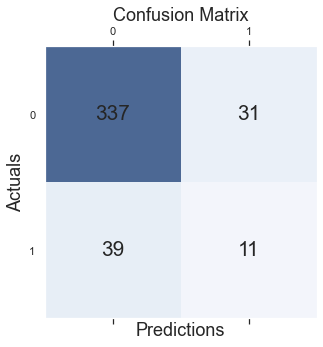

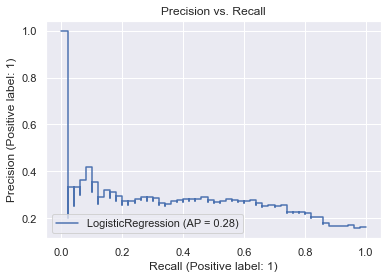

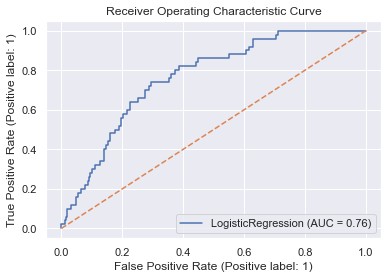

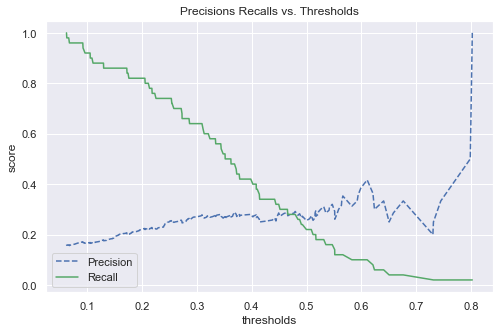

In [38]:
clf = models[model_key].best_estimator_
print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
print(user)
print(clf)
full_report(clf, X_train, X_test, y_train, y_test)
y_proba = clf.predict_proba(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

Threshold: 0.255


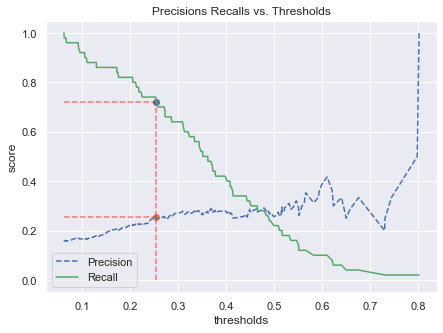

              precision    recall  f1-score   support

           0       0.95      0.71      0.81       368
           1       0.25      0.72      0.38        50

    accuracy                           0.71       418
   macro avg       0.60      0.72      0.59       418
weighted avg       0.87      0.71      0.76       418



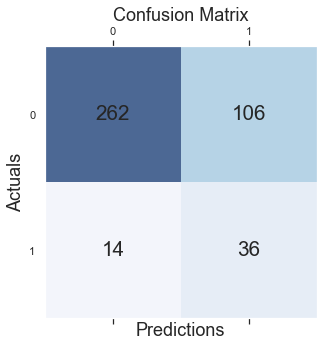

  Confusion Matrix Metrics
  How often is the classifier correct?
  Accuracy: 36.627%

  How often is it wrong?
  Error Rate: -35.627%

  When it's actually yes, how often does it predict yes?
  True Positive Rate (Recall): 72.000%

  When it predicts yes, how often is it correct?
  Precision: 25.352%

  When it's actually no, how often does it predict yes?
  False Positive Rate: 28.804%

  When it's actually no, how often does it predict no?
  True Negative Rate (Specificity): 71.196%
  F1 Score: 0.375
  Weighted F1 Score (beta = 2): 0.526
  G-mean: 0.427


In [39]:
thresh = plot_threshold(precisions, recalls, thresholds, clf, recall_thresh=0.7)

y_pred = (clf.predict_proba(X_test)[:,1] >= thresh).astype(int)
print(classification_report(y_test, y_pred))
plot_confusion_matrix(y_test, y_pred, show_metrics=True)

# Testing Model and Interpretability

In [85]:
case_study_feat = ['mentions',
 'hashtags',
 'cashtags',
 'video',
 'photos',
 'urls',
 'number of tweets',
 'number of emojis',
 'tweet length',
 'number of sentences',
 'number of words',
 'avg words per sentence',
 'number of nouns',
 'number of verbs',
 'number of stopwords',
 'number of organizations']

In [86]:
# Separate Training from Testing
train_data = df_training.copy(deep=True)
train_data = train_data[train_data['username']==user]
test_data = df_testing.copy(deep=True)
test_data = test_data[test_data['username']==user]
train_data.reset_index(inplace=True, drop=True)
train_idx = train_data.index
start = len(train_data)
stop = len(train_data)+len(test_data)
test_idx = np.arange(start, stop)
test_data.index = test_idx

numerical_feat = case_study_feat.copy()
target_name = 'classification'
text_name = 'cleaned'
col_name = 'no change_change' 
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]

train_data[target_name] = 0
train_data[target_name][train_data[col_name] == labels[1]] = 1


test_data[target_name] = 0
test_data[target_name][test_data[col_name] == labels[1]] = 1


df = pd.concat([train_data, test_data])


# Get bins and calculate class_weight on training data


In [87]:
%%time
# Clocked at 3min 20s
grid={
    "C":np.logspace(-3,3,7), "penalty":["l1","l2"], "dual":[False, True],
    "solver" : ['liblinear', 'saga']
} 

len_1 = len(train_data[train_data['classification'] == 0])
len_2 = len(train_data[train_data['classification'] == 1])
class_weight = {0:1, 1:(len_1/len_2)}


X, y = make_xy(df,
    target_name,
    numerical_feat,
    text_name
)

X_train = X.loc[train_idx]
X_test = X.loc[test_idx]
y_train = y.loc[train_idx]
y_test = y.loc[test_idx]

# Separate into Training/Testing
scoring = 'roc_auc'
clf = LogisticRegression(n_jobs=-1, class_weight=class_weight)
clf_cv=GridSearchCV(lgr,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)

tuned hyperparameters :(best parameters)  {'C': 1.0, 'dual': False, 'penalty': 'l1', 'solver': 'saga'}
best score : 0.8008992481438797
CPU times: user 1min 44s, sys: 15.1 s, total: 1min 59s
Wall time: 12min 39s


In [88]:
model_key =  col_name + '_clf_test'
key = "clf_cv_test"

# Save Results
models[model_key] = clf_cv

lgr_params = pd.DataFrame(clf_cv.cv_results_)
lgr_params['username'] = user
lgr_params['scoring'] = scoring
lgr_params['n_class_0'] = len_1
lgr_params['n_class_1'] = len_2

cv_scores[key] = lgr_params

all_scores[col_name] = cv_scores

COLUMN: no change_change
 MODEL_KEY: no change_change_clf_test
 CV_KEY: clf_cv_test
richardbranson
LogisticRegression(class_weight={0: 1, 1: 4.396390374331551}, n_jobs=-1,
                   penalty='l1', solver='saga')
The mean cross-validation accuracy is: 0.816 +/- 0.006
Precision: 0.364
Recall: 0.494
Balanced accuracy: 0.677
              precision    recall  f1-score   support

           0       0.91      0.86      0.88       531
           1       0.36      0.49      0.42        87

    accuracy                           0.81       618
   macro avg       0.64      0.68      0.65       618
weighted avg       0.83      0.81      0.82       618



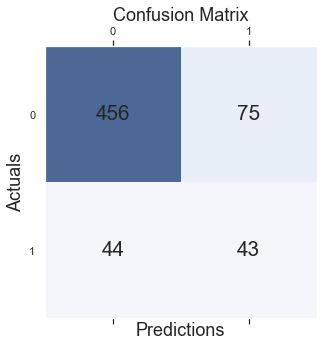

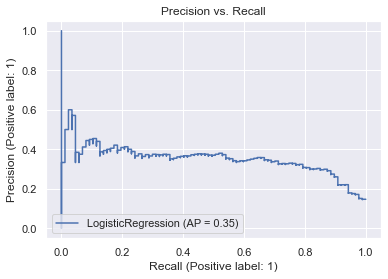

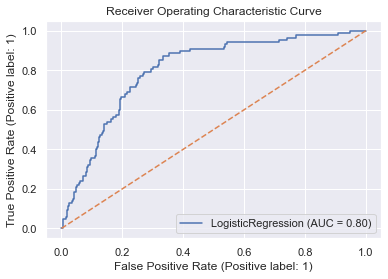

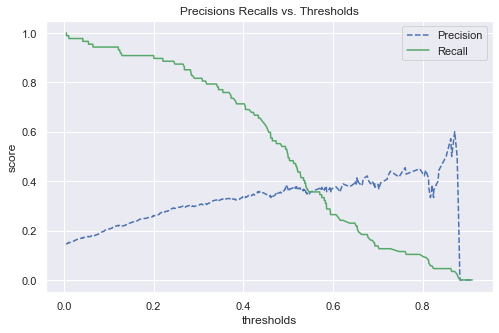

In [89]:
clf = models[model_key].best_estimator_
print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
print(user)
print(clf)
full_report(clf, X_train, X_test, y_train, y_test)
y_proba = clf.predict_proba(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

Threshold: 0.316


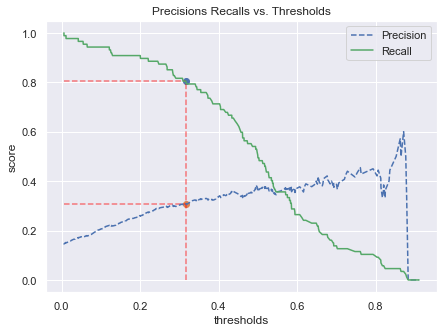

richardbranson
LogisticRegression(class_weight={0: 1, 1: 4.396390374331551}, n_jobs=-1,
                   penalty='l1', solver='saga')
              precision    recall  f1-score   support

           0       0.96      0.70      0.81       531
           1       0.31      0.80      0.45        87

    accuracy                           0.72       618
   macro avg       0.63      0.75      0.63       618
weighted avg       0.87      0.72      0.76       618



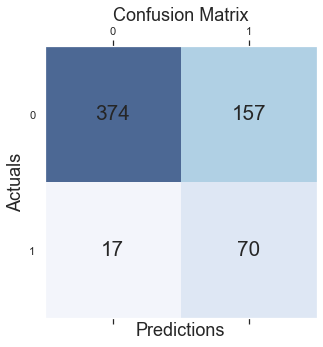

  Confusion Matrix Metrics
  How often is the classifier correct?
  Accuracy: 70.605%

  How often is it wrong?
  Error Rate: -69.605%

  When it's actually yes, how often does it predict yes?
  True Positive Rate (Recall): 80.460%

  When it predicts yes, how often is it correct?
  Precision: 30.837%

  When it's actually no, how often does it predict yes?
  False Positive Rate: 29.567%

  When it's actually no, how often does it predict no?
  True Negative Rate (Specificity): 70.433%
  F1 Score: 0.446
  Weighted F1 Score (beta = 2): 0.609
  G-mean: 0.498


In [90]:
# default threshold is 0.5
thresh = plot_threshold(precisions, recalls, thresholds, clf, recall_thresh=0.80)
print(user)
print(clf)
y_pred = (clf.predict_proba(X_test)[:,1] >= thresh).astype(int)
print(classification_report(y_test, y_pred))
plot_confusion_matrix(y_test, y_pred, show_metrics=True)

# Interpretation

In [110]:
most_predictive_words(clf, train_data['cleaned'], train_data[target_name], min_df=2)


 Most Predictive Words for bin: 0
     
                like 0.98
              people 0.98
                 too 0.99
                 way 0.99
               enjoy 0.99
                hope 1.00
                know 1.00
                need 1.00
               quote 1.00
                 not 1.00

 Most Predictive Words for bin: 1
     
               sneak 0.99
              crisis 0.99
         spaceflight 1.00
           executive 1.00
              repair 1.00
              reckon 1.00
                kill 1.00
               grand 1.00
               beach 1.00
        conversation 1.00




In [116]:
target_word = 'spaceflight'
i = get_index(test_data['cleaned'], target_word)
test_data['tweet'].loc[i]

".@VirginGalactic is moving to New Mexico  https://t.co/kSsQC1PQJw  https://t.co/JSoNjeTABM We have now completed two spaceflights and we’ll carry on the flight test program in New Mexico  https://t.co/kSsQC1PQJw @VirginGalactic  https://t.co/7qWrvr1Hlf It’s going to be special to see the world’s most beautiful spaceship fly from one of the world’s most wonderfully designed buildings, Spaceport America  https://t.co/kSsQC1PQJw @virgingalactic  https://t.co/owrz1dOBOy Thrilled to announce that @VirginGalactic is taking its next step towards full commercial service by moving its operations to Spaceport America in New Mexico this summer  https://t.co/kSsQC1PQJw  https://t.co/WAIb2fXrPa Watch live: Thrilled to announce @virgingalactic's next step towards commercial service  https://t.co/1iyX7kZEYg  https://t.co/bgBxzqwLIM"

[[0.97105385 0.02894615]]
Document id: 1420
Percent Change: -0.001
Probability(Change) = 0.027
True class: no change


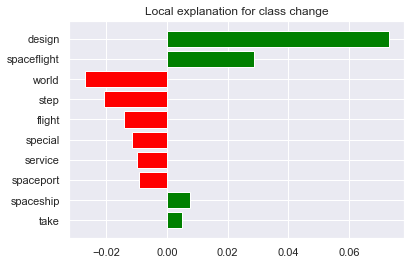

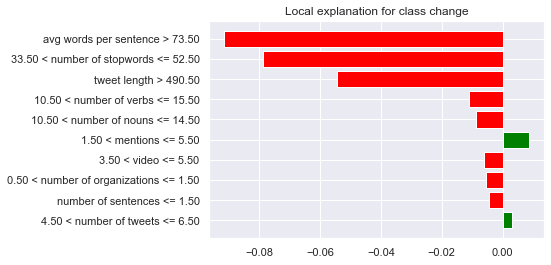

In [118]:
idx = i
class_names = ['no change', 'change']
interpret_instance(clf, train_data, test_data, class_names, idx, numerical_feat, 10)

In [96]:
classifications = pd.DataFrame()
classifications['actual'] = y_test.copy(deep=True)
classifications['percent change'] = test_data['percent change']
classifications['y_pred'] = y_pred
classifications['y_proba_1'] = y_proba[:,1]
misclassifications = classifications[classifications['actual'] != classifications['y_pred']]
correct_classifications = classifications[classifications['actual'] == classifications['y_pred']]
print('Misclassified change as no change {} times'.format(len(misclassifications[misclassifications['actual'] == 1])))
print('Top 5 misclassifications')
misclassifications[misclassifications['actual'] == 1].sort_values(by='y_proba_1')[:5]

Misclassified change as no change 17 times
Top 5 misclassifications


,actual,percent change,y_pred,y_proba_1
1789,1,-0.038095,0,0.005999
1631,1,0.047939,0,0.011220
1773,1,-0.027197,0,0.042478
1776,1,0.070473,0,0.054575
1958,1,0.026756,0,0.064675


In [121]:
test_data['tweet'].loc[1737]

'Discussing the future of design, #STEM and what it takes to paint a rocket with Heidi Rueff - @Virgin_Orbit’s graphic designer:  https://t.co/9A8bS11DoM #VirginFamily  https://t.co/8vvuvruqtt'

In [120]:
test_data.loc[1789]

date                                                     2017-09-29 16:00:00
tweet                      Climate change creates huge opportunities for ...
username                                                      richardbranson
mentions                                                                   1
hashtags                                                                   4
cashtags                                                                   0
video                                                                      6
photos                                                                     6
urls                                                                       8
replies_count                                                            598
retweets_count                                                          5520
likes_count                                                             6546
number of tweets                                                          11

[[0.68026528 0.31973472]]
Document id: 1789
Percent Change: -0.038
Probability(Change) = 0.063
True class: change


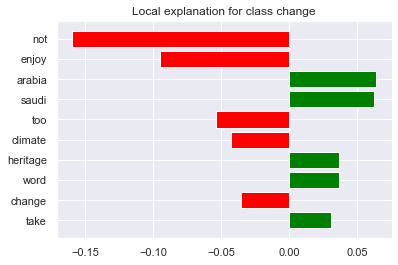

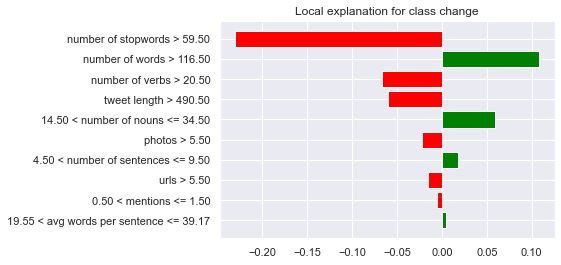

In [92]:
idx = misclassifications[misclassifications['actual'] == 1].sort_values(by='y_proba_1').index[0]
class_names = ['no change', 'change']
interpret_instance(clf, train_data, test_data, class_names, idx, numerical_feat, 10)

In [97]:
print('Misclassified no change as change {} times'.format(len(misclassifications[misclassifications['actual'] == 0])))
print('Top 5 misclassifications')
misclassifications[misclassifications['actual'] == 0].sort_values(by='y_proba_1', ascending=False)[:5]

Misclassified no change as change 157 times
Top 5 misclassifications


,actual,percent change,y_pred,y_proba_1
1737,0,0.001750,1,0.910681
1904,0,0.000000,1,0.883021
2008,0,0.000000,1,0.864749
1595,0,0.000787,1,0.852334
1682,0,-0.003304,1,0.836310


[[0.73727817 0.26272183]]
Document id: 1737
Percent Change: 0.002
Probability(Change) = 0.590
True class: no change


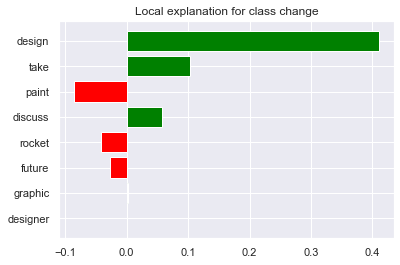

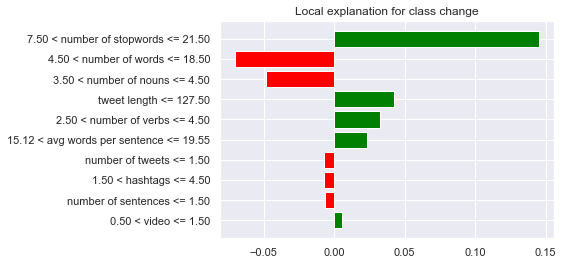

In [99]:
#### idx = misclassifications[misclassifications['actual'] == 0].sort_values(by='y_proba_1', ascending=False).index[0]
class_names = ['no change', 'change']
interpret_instance(clf, train_data, test_data, class_names, idx, numerical_feat, 10)

In [62]:
classifications

,actual,percent change,y_pred,y_proba_1
1391,1,0.034364,1,0.624205
1392,0,0.007034,0,0.002742
1393,0,0.003980,0,0.024339
1394,0,0.000823,0,0.075465
1395,0,0.003996,0,0.232178
...,...,...,...,...
2004,0,0.000000,0,0.014293
2005,0,-0.001005,0,0.028881
2006,0,0.000000,0,0.134056
2007,0,0.008639,1,0.493976


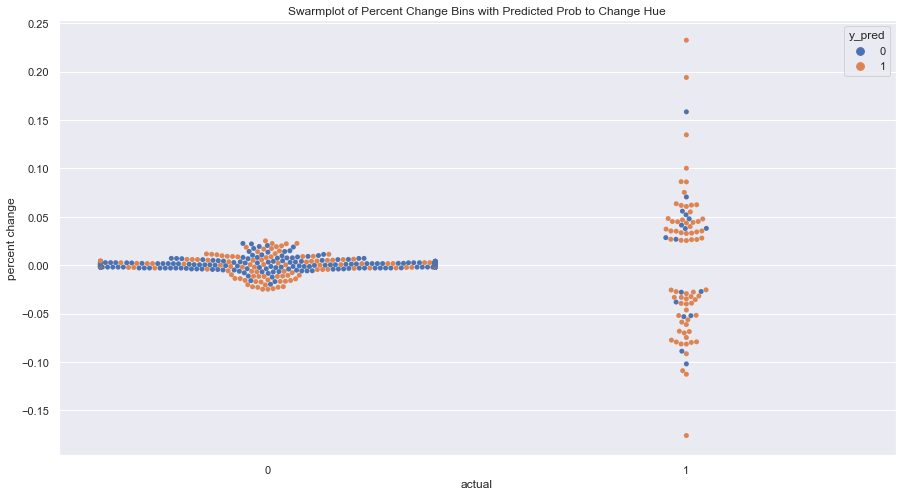

In [124]:
sns.set()
fig, ax = plt.subplots(figsize=(15,8))
ax = sns.swarmplot(y="percent change", x='actual', hue="y_pred", data=classifications, size=5)
norm = plt.Normalize(classifications['y_proba_1'].min(), classifications['y_proba_1'].max())

# Remove the legend and add a colorbar
ax.get_legend()
plt.title('Swarmplot of Percent Change Bins with Predicted Prob to Change Hue')
plt.savefig('./figures/modeling/swarmplot_cat.png', bbox_inches='tight')

plt.show()

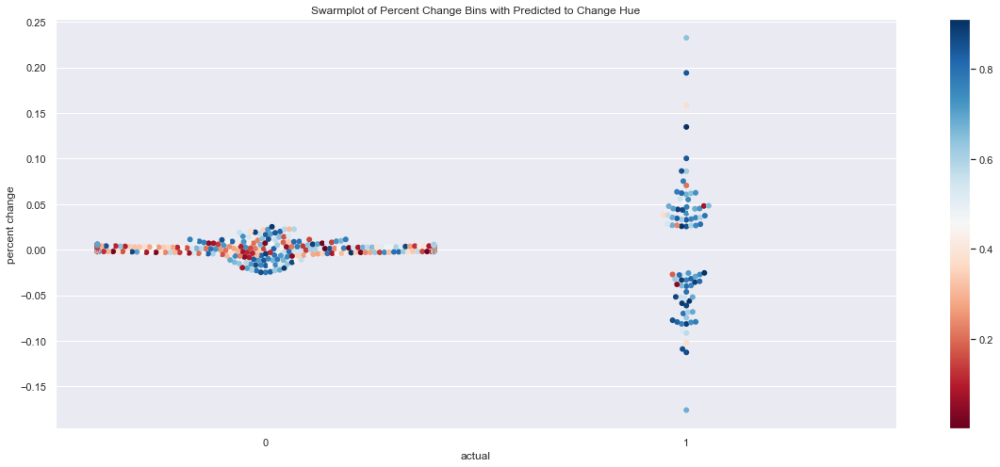

In [127]:
#### sns.set()
fig, ax = plt.subplots(figsize=(20,8))
ax = sns.swarmplot(y="percent change", x='actual', hue="y_proba_1", palette='RdBu', data=classifications, size=6)
norm = plt.Normalize(classifications['y_proba_1'].min(), classifications['y_proba_1'].max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])

# Remove the legend and add a colorbar
ax.get_legend().remove()
ax.figure.colorbar(sm)
plt.title('Swarmplot of Percent Change Bins with Predicted to Change Hue')
plt.savefig('./figures/modeling/swarmplot_pred.png', bbox_inches='tight')

plt.show()

In [65]:
for user in list(tweet_stocks['username'].unique()):
    print(user.upper())
    chi2_sig(tweet_stocks[tweet_stocks['username'] == user], 'bins', numerical_feat, 'cleaned')

ELONMUSK
Statistically Significant Words Per Bin
P_val = 0.95

# drop:
  . selected features: 34
  . top features: strawberry,insightful,grateful,forever,adams,douglas,zenit,bridge,selling,monica
 
# no change:
  . selected features: 0
  . top features: 
 
# rise:
  . selected features: 20
  . top features: lhc,savage,exposure,professor,doug,yay,dome,wand,lifemonth,cheese
 
Statistically Significant Features Per Bin
P_val = 0.95

# drop:
  . selected features: 0
  . top features: 
 
# no change:
  . selected features: 0
  . top features: 
 
# rise:
  . selected features: 0
  . top features: 
 
LEVIE
Statistically Significant Words Per Bin
P_val = 0.95

# drop:
  . selected features: 35
  . top features: bluetooth,infinity,strange,childhood,stress,disaster,bored,neighborhood,nice,garage
 
# no change:
  . selected features: 4
  . top features: cat,content,bluetooth,measure
 
# rise:
  . selected features: 25
  . top features: tab,blog,disastrous,january,heist,nft,bathtub,process,death,t

In [66]:
# Plot percent change with y_proba hue00

# Just words and features

In [67]:
numerical_feat = case_study_feat.copy()
target_name = 'classification'
text_name = 'cleaned'
col_name = 'no change_change' 
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]

train_data[target_name] = 0
train_data[target_name][train_data[col_name] == labels[1]] = 1


test_data[target_name] = 0
test_data[target_name][test_data[col_name] == labels[1]] = 1


df = pd.concat([train_data, test_data])

In [68]:
%%time
# Clocked at 3min 20s
grid={
    "C":np.logspace(-3,3,7), "penalty":["l1","l2"], "dual":[False, True],
    "solver" : ['liblinear', 'saga']
} 

len_1 = len(train_data[train_data['classification'] == 0])
len_2 = len(train_data[train_data['classification'] == 1])
class_weight = {0:1, 1:(len_1/len_2)}


X = df[numerical_feat]
y = df[target_name]

X_train = X.loc[train_idx]
X_test = X.loc[test_idx]
y_train = y.loc[train_idx]
y_test = y.loc[test_idx]

scaler = MinMaxScaler(feature_range=(0,1))
scaler.fit(X_train)
scaled = scaler.fit_transform(X_test)

X_test = pd.DataFrame(scaled, columns=X.columns)

# Separate into Training/Testing
scoring = 'roc_auc'
clf = LogisticRegression(n_jobs=-1, class_weight=class_weight)
clf_cv=GridSearchCV(lgr,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)

tuned hyperparameters :(best parameters)  {'C': 0.1, 'dual': False, 'penalty': 'l1', 'solver': 'liblinear'}
best score : 0.7840657364505177
CPU times: user 11.3 s, sys: 169 ms, total: 11.4 s
Wall time: 18.1 s


In [69]:
model_key =  col_name + '_clf_feat'
key = "clf_cv_feat"

# Save Results
models[model_key] = clf_cv

lgr_params = pd.DataFrame(clf_cv.cv_results_)
lgr_params['username'] = user
lgr_params['scoring'] = scoring
lgr_params['n_class_0'] = len_1
lgr_params['n_class_1'] = len_2

cv_scores[key] = lgr_params

all_scores[col_name] = cv_scores

COLUMN: no change_change
 MODEL_KEY: no change_change_clf_feat
 CV_KEY: clf_cv_feat
richardbranson
LogisticRegression(C=0.1, class_weight={0: 1, 1: 4.440026954177897}, n_jobs=-1,
                   penalty='l1', solver='liblinear')
The mean cross-validation accuracy is: 0.788 +/- 0.024
Precision: 0.141
Recall: 1.000
Balanced accuracy: 0.500
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       531
           1       0.14      1.00      0.25        87

    accuracy                           0.14       618
   macro avg       0.07      0.50      0.12       618
weighted avg       0.02      0.14      0.03       618



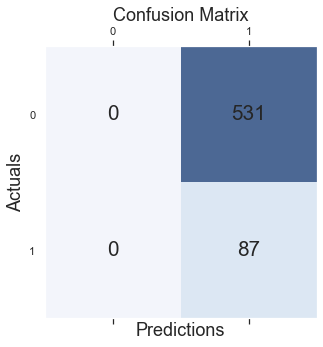

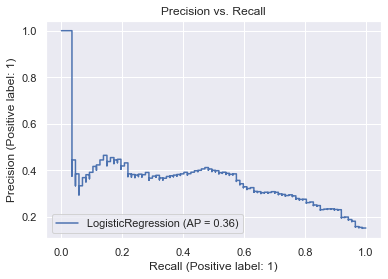

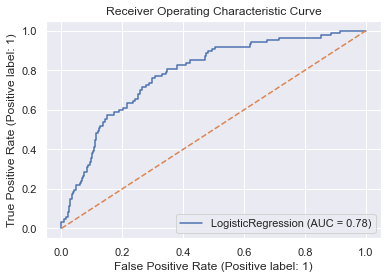

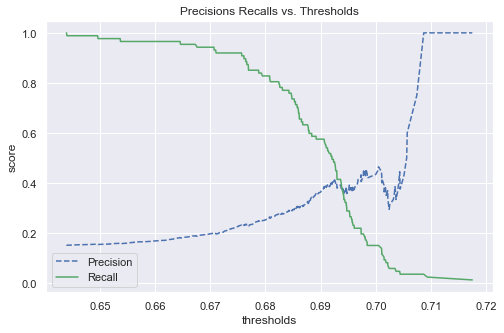

In [70]:
clf = models[model_key].best_estimator_
print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
print(user)
print(clf)
full_report(clf, X_train, X_test, y_train, y_test)
y_proba = clf.predict_proba(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

# Just words

In [71]:
class_weight

{0: 1, 1: 7.3293413173652695}

In [72]:
%%time
# Clocked at 12min 51s
grid={
    "C":np.logspace(-3,3,7), "penalty":["l1","l2"], "dual":[False, True],
    "solver" : ['liblinear', 'saga']
} 

len_1 = len(train_data[train_data['classification'] == 0])
len_2 = len(train_data[train_data['classification'] == 1])
class_weight = {0:1, 1:(len_1/len_2)}


X = df[text_name]
y = df[target_name]

vectorizer = TfidfVectorizer()
sparse_text_matrix = vectorizer.fit_transform(X)

X = pd.DataFrame(sparse_text_matrix.toarray(), columns=vectorizer.get_feature_names())

X_train = X.loc[train_idx]
X_test = X.loc[test_idx]
y_train = y.loc[train_idx]
y_test = y.loc[test_idx]





# Separate into Training/Testing
scoring = 'roc_auc'
clf = LogisticRegression(n_jobs=-1, class_weight=class_weight)
clf_cv=GridSearchCV(lgr,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)

tuned hyperparameters :(best parameters)  {'C': 0.01, 'dual': False, 'penalty': 'l2', 'solver': 'liblinear'}
best score : 0.7146038643366183
CPU times: user 1min 12s, sys: 11.1 s, total: 1min 23s
Wall time: 11min 16s


In [73]:
model_key =  col_name + '_clf_text'
key = "clf_cv_text"

# Save Results
models[model_key] = clf_cv

lgr_params = pd.DataFrame(clf_cv.cv_results_)
lgr_params['username'] = user
lgr_params['scoring'] = scoring
lgr_params['n_class_0'] = len_1
lgr_params['n_class_1'] = len_2

cv_scores[key] = lgr_params

all_scores[col_name] = cv_scores

COLUMN: no change_change
 MODEL_KEY: no change_change_clf_text
 CV_KEY: clf_cv_text
richardbranson
LogisticRegression(C=0.01, class_weight={0: 1, 1: 4.440026954177897}, n_jobs=-1,
                   solver='liblinear')
The mean cross-validation accuracy is: 0.880 +/- 0.002
Precision: 0.000
Recall: 0.000
Balanced accuracy: 0.500
              precision    recall  f1-score   support

           0       0.86      1.00      0.92       531
           1       0.00      0.00      0.00        87

    accuracy                           0.86       618
   macro avg       0.43      0.50      0.46       618
weighted avg       0.74      0.86      0.79       618



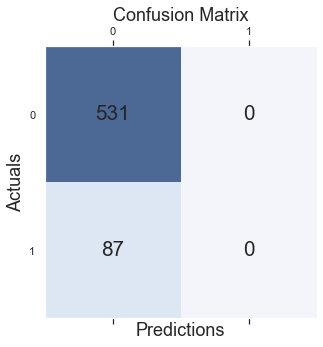

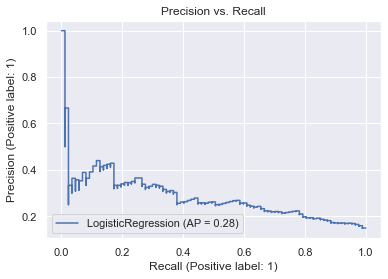

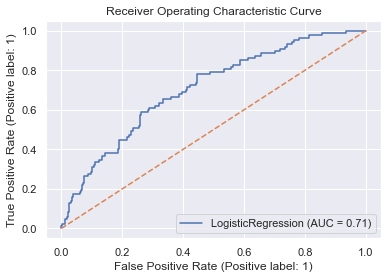

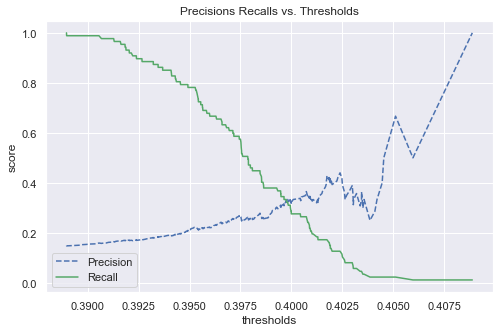

In [74]:
clf = models[model_key].best_estimator_
print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
print(user)
print(clf)
full_report(clf, X_train, X_test, y_train, y_test)
y_proba = clf.predict_proba(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)